# **Latar Belakang**

Sebagai seorang data analis yang beroperasi di perusahaan bisnis properti, kami menyadari bahwa Airbnb semakin berkembang pesat sebagai platform penyewaan properti yang populer khususnya di kota Bangkok. Di tengah pesatnya perkembangan ini, pemahaman yang mendalam tentang karakteristik properti yang paling dicari oleh penyewa sangat penting. Memahami tren ini akan membantu perusahaan kami untuk mengambil keputusan yang lebih tepat dalam merancang strategi bisnis sewa properti di Bangkok, serta mengoptimalkan pendapatan.

## **Pernyataan Masalah**

Dalam kapasitas kami sebagai data analis, pertanyaan utama yang kami hadapi adalah
 1. Apa karakteristik utama dari properti di Bangkok pada platform Airbnb yang paling diminati oleh penyewa? 
 2. Bagaimana merancang strategi yang tepat dalam membantu perusahaan untuk mengoptimalkan pendapatan?

Dengan pemahaman yang lebih baik tentang preferensi penyewa, perusahaan dapat mengambil langkah-langkah yang lebih tepat dalam mengelola portofolio properti dan meningkatkan daya saing di pasar.

# **Data**

Untuk menjawab masalah di atas, kami akan menganalisa data yang sudah didapatkan dari Airbnb untuk wilayah Bangkok. Dataset ini dapat diakses 
[di sini](https://drive.google.com/drive/folders/1A_KBMRFTS5Mthpp46nulso679ML4ZwTF).

## Import Library

In [138]:
import numpy as np
import pandas as pd

# visualisasi
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import geopandas as gpd

# uji statistik
from scipy.stats import shapiro
from scipy.stats import kruskal

# menghilangkan warning
import warnings
warnings.filterwarnings('ignore')

Kita akan melakukan analisis menggunakan dataset "Airbnb Listings Bangkok". Melalui analisis ini, kami akan dijawab pertanyaan-pertanyaan di atas

berikut Dataset "Airbnb Listings Bangkok":
1. **id**: Nomor identifikasi unik properti dalam sistem Airbnb.
2. **name**: Nama properti yang ditampilkan dalam daftar Airbnb.
3. **host_id**: Nomor identifikasi unik tuan rumah (pemilik properti) di Airbnb.
4. **host_name**: Nama tuan rumah (hanya nama depan biasanya).
5. **neighborhood**: Daerah atau lingkungan geografis di mana properti terletak.
6. **latitude**: Koordinat lintang properti menggunakan sistem proyeksi World Geodetic System (WGS84).
7. **longitude**: Koordinat bujur properti menggunakan sistem proyeksi World Geodetic System (WGS84).
8. **room_type**: Jenis kamar yang ditawarkan, seperti "Entire home/apt" (seluruh rumah/apartemen), "Private room" (kamar pribadi), "Shared room" (kamar bersama), atau "Hotel".
9. **price**: Harga sewa harian properti dalam mata uang lokal (bath).
10. **minimum_nights**: Jumlah minimum malam yang harus dipesan untuk properti tersebut.
11. **number_of_reviews**: Total jumlah ulasan yang diterima properti.
12. **last_review**: Tanggal ulasan terakhir dari tamu.
13. **reviews_per_month** :  Jumlah ulasan per bulan
14. **calculated_host_listings_count**: Jumlah total properti yang dimiliki oleh tuan rumah di Bangkok.
15. **availability_365**: Jumlah hari dalam setahun di mana properti tersedia untuk disewakan.
16. **number_of_reviews_ltm**: Jumlah ulasan yang diterima properti dalam 12 bulan terakhir.

## Contoh Data

In [139]:
df = pd.read_csv('Airbnb Listings Bangkok.csv')
display(df.head(), df.tail())

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15849,15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15850,15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaN,NaN,14,365,0
15851,15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaN,NaN,14,365,0
15852,15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaN,NaN,14,365,0
15853,15853,790476492384199044,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.752960,100.540820,Private room,1214,1,0,NaN,NaN,14,365,0


Di atas merupakan tampilan 5 data teratas dan 5 data terbawah dari dataframe kita

## Pemahaman terhadap Data (***Data Understanding***)

### Memahami Struktur Data
**Tujuan**: Langkah pertama adalah memahami struktur dasar dari dataset, termasuk informasi tentang jumlah baris dan kolom, tipe data, serta nama kolom.
<br>
**Alasan**: Memahami struktur data awal akan membantu dalam merencanakan langkah-langkah berikutnya dalam analisis dan membersihkan data jika diperlukan.

In [140]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Unnamed: 0                      15854 non-null  int64  
 1   id                              15854 non-null  int64  
 2   name                            15846 non-null  object 
 3   host_id                         15854 non-null  int64  
 4   host_name                       15853 non-null  object 
 5   neighbourhood                   15854 non-null  object 
 6   latitude                        15854 non-null  float64
 7   longitude                       15854 non-null  float64
 8   room_type                       15854 non-null  object 
 9   price                           15854 non-null  int64  
 10  minimum_nights                  15854 non-null  int64  
 11  number_of_reviews               15854 non-null  int64  
 12  last_review                     

In [141]:
num_rows, num_cols = df.shape
print(f"Jumlah Baris: {num_rows}, Jumlah Kolom: {num_cols}")

Jumlah Baris: 15854, Jumlah Kolom: 17


### Statistik Deskriptif
**Tujuan**: Melakukan analisis statistik deskriptif untuk memahami rata-rata, median, nilai maksimal, dan minimal dari setiap variabel numerik dalam dataset.
<br>
**Alasan**: Statistik deskriptif membantu mendapatkan gambaran umum tentang variabel-variabel numerik dalam dataset.

In [142]:
# Statistik deskriptif data numerik
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,15854.0,7.926500e+03,4.576800e+03,0.00000,3.963250e+03,7.926500e+03,1.188975e+04,1.585300e+04
id,15854.0,1.579397e+17,2.946015e+17,27934.00000,2.104509e+07,3.503734e+07,5.256154e+07,7.908162e+17
host_id,15854.0,1.541058e+08,1.318726e+08,58920.00000,3.974431e+07,1.224556e+08,2.390547e+08,4.926659e+08
latitude,15854.0,1.374514e+01,4.303957e-02,13.52730,1.372009e+01,1.373849e+01,1.375950e+01,1.395354e+01
longitude,15854.0,1.005599e+02,5.091058e-02,100.32955,1.005297e+02,1.005614e+02,1.005851e+02,1.009234e+02
price,15854.0,3.217704e+03,2.497212e+04,0.00000,9.000000e+02,1.429000e+03,2.429000e+03,1.100000e+06
minimum_nights,15854.0,1.529236e+01,5.081502e+01,1.00000,1.000000e+00,1.000000e+00,7.000000e+00,1.125000e+03
number_of_reviews,15854.0,1.665416e+01,4.061333e+01,0.00000,0.000000e+00,2.000000e+00,1.300000e+01,1.224000e+03
reviews_per_month,10064.0,8.131449e-01,1.090196e+00,0.01000,1.200000e-01,4.350000e-01,1.060000e+00,1.913000e+01
calculated_host_listings_count,15854.0,1.388962e+01,3.026985e+01,1.00000,1.000000e+00,4.000000e+00,1.300000e+01,2.280000e+02


Tabel di atas merupakan deskriptif statistik kolom dengan tipe data numerik pada data kita. Pada tabel ini terlihat persebaran data min dan maxnya rentangnya sangat jauh (kemungkinan banyak outliers). Nilai mean dan median (50%) hampir semua kolom nilainya berbeda signifikan (kemungkinan datanya terdistribusi tidak normal)

In [143]:
# Statistik deskriptif data kategori/ object
df.describe(include='object')

,name,host_name,neighbourhood,room_type,last_review
count,15846,15853,15854,15854,10064
unique,14794,5312,50,4,1669
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt,2022-12-11
freq,45,228,2153,8912,189


Tabel di atas merupakan deskriptif statistik kolom dengan tipe data object pada data kita. Terlihat bahwa data kategorikal yang kita punya ada pada kolom neighbourhood(50 jenis) dan room_type(4 jenis).

### Distribusi dan Visualisasi Data
**Tujuan** : Melihat distribusi data dan mengidentifikasi pola melalui visualisasi grafik (histogram).
<br>
**Alasan** : Visualisasi membantu melihat persebaran data awal dan membantu dalam pengambilan keputusan dalam menangani missing value

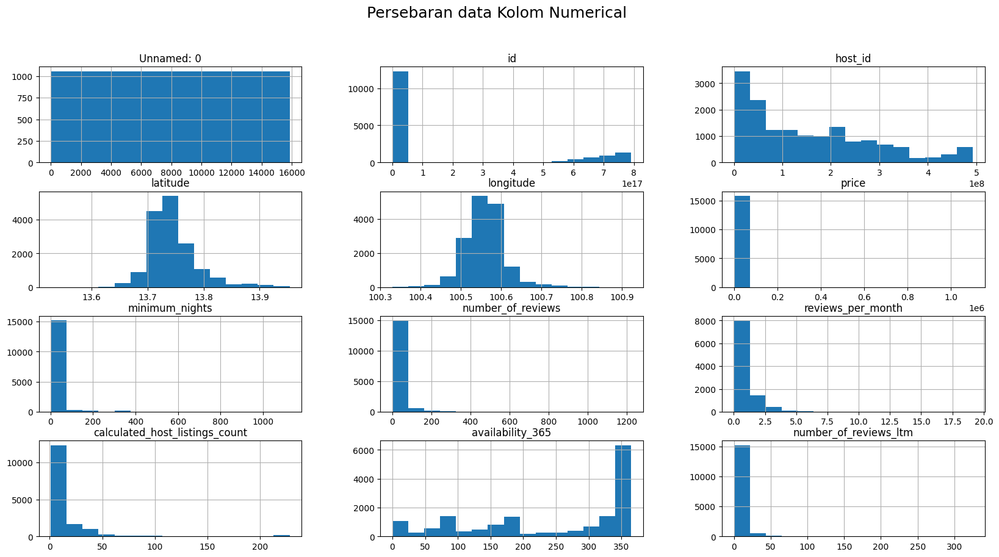

In [144]:
# Membuat histplot untuk seluruh kolom numerical
df.hist(bins=15, figsize=(20,10))
plt.suptitle('Persebaran data Kolom Numerical', size=18)
plt.show()

Setelah kita lihat berdasarkan tabel statistik deskriptif, kita juga bisa melihat persebaran datanya melalui histogram di atas ini. Ternyata saat dilihat berdasarkan visualisasi kolom latitude dan longtitude datanya cenderung terdistribusi normal dan minim outliers. Sedangkan untuk kolom price, minimum_night, number_of_reviews, calculated_host_listings_counts, availability, number_of_reviews datanya cenderung tidak terdistribusi normal dan terlihat banyak data outliers

## Membersihkan Data (***Data Cleaning***)

Membersihkan data adalah salah satu langkah penting dalam proses analisis data. Ini melibatkan identifikasi, penanganan, dan pemrosesan data yang kotor atau tidak sempurna agar data menjadi lebih siap dan dapat diolah. Langkah ini diperlukan untuk analisis lebih lanjut untuk membantu menjawab pertanyaan terkait permasalahan.

### Penanganan Data yang Kosong (Missing Value)

In [145]:
# persentase jumlah missing value dari setiap kolom
df.isna().sum() / df.shape[0] * 100

Unnamed: 0                         0.000000
id                                 0.000000
name                               0.050460
host_id                            0.000000
host_name                          0.006308
neighbourhood                      0.000000
latitude                           0.000000
longitude                          0.000000
room_type                          0.000000
price                              0.000000
minimum_nights                     0.000000
number_of_reviews                  0.000000
last_review                       36.520752
reviews_per_month                 36.520752
calculated_host_listings_count     0.000000
availability_365                   0.000000
number_of_reviews_ltm              0.000000
dtype: float64

Berdasarkan informasi di atas, terdapat 4 kolom yang memiliki data kosong :
1. **name** berjumlah 8 (0.05%)
2. **host_name** berjumlah 1 (0.006%)
3. **last_review** berjumlah 5790 (36,5%)
4. **reviews_per_month** berjumlah 5790 (36,5%)

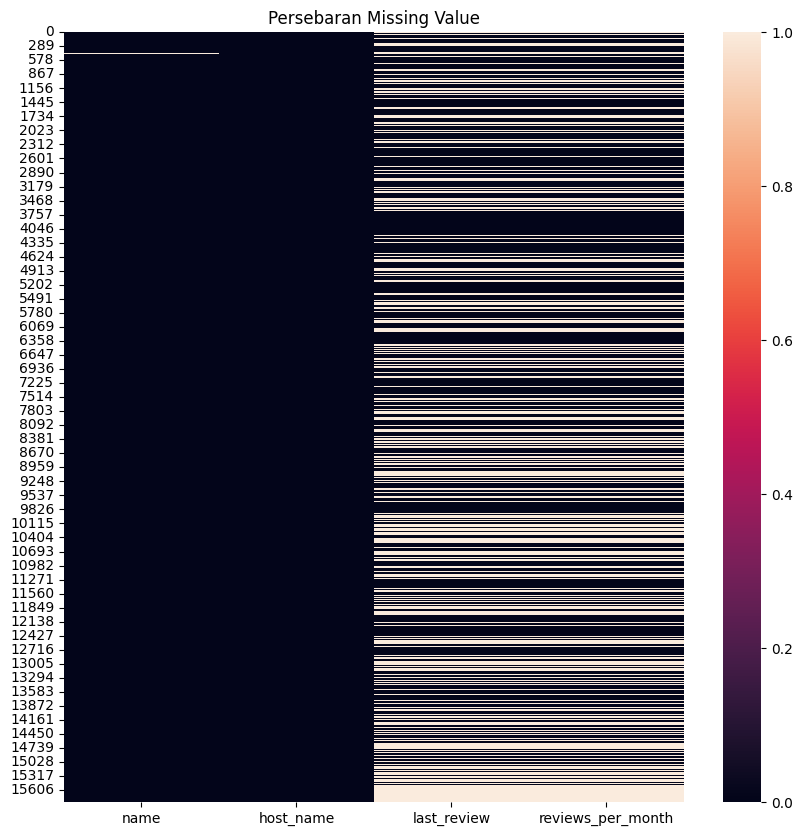

In [146]:
# Persebaran missing value di dalam data
plt.figure(figsize=(10,10))
sns.heatmap(df[['name', 'host_name','last_review','reviews_per_month']].isna())
plt.title('Persebaran Missing Value')

plt.show()

**Kolom name** 

adalah nama properti yang ditampilkan dalam daftar Airbnb. Jika dilihat dari nama yang ada pada baris lainnya, berisikan terkait nama properti dan keterangan terkait properti tersebut (contoh: jumlah kamar, dekat dengan lokasi tertentu). Maka pada kolom ini kami akan isi dengan menggabungkan kolom room_type dengan neighbourhood agar mirip dengan data di baris lainnya.


In [147]:
# mengecek index kolom name yang kosong
index_name_nan = df.loc[df['name'].isna()].index
index_name_nan

Index([439, 544, 572, 669, 1030, 1282, 1594, 2075], dtype='int64')

In [148]:
# mengisi kolom nama yang kosong dengan [room_type] in [neighbourhood]
df['name'] = df['name'].fillna(df['room_type'] + ' in ' + df['neighbourhood'])

In [149]:
# pengecekkan pengisian data kosong di kolom name
display(df.loc[index_name_nan]['name'].value_counts(), df['name'].isna().sum())

name
Private room in Vadhana         2
Private room in Phra Khanong    1
Private room in Din Daeng       1
Private room in Bang Phlat      1
Entire home/apt in Bang Na      1
Private room in Ratchathewi     1
Private room in Khlong Toei     1
Name: count, dtype: int64

0

**Kolom host_name** 

secara domain knowledge host_name memiliki hubungan dengan host_id. Sehingga pada baris yang kosong pada kolom host_name akan diisi sesuai dengan host_idnya

In [150]:
# mengecek index kolom host_name yang kosong
index_host_name_nan = df.loc[df['host_name'].isna()].index
index_host_name_nan

Index([3571], dtype='int64')

In [151]:
# mengisi kolom host_name yang kosong dengan host_id
df['host_name'] = df['host_name'].fillna(df['host_id'])

In [152]:
# pengecekkan pengisian data kosong di kolom name
display(df.loc[[index_host_name_nan[0]]], df['name'].isna().sum())

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,3571,19682464,Cozy Hideaway,137488762,137488762,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


0

**Kolom last_review & reviews_per_month**

In [153]:
# mengecek index kolom last_review & reviews_per_month yang kosong
display(df[df['last_review'].isna()].index, df[df['reviews_per_month'].isna()].index)

Index([    1,     2,     4,     7,    14,    15,    20,    21,    26,    27,
       ...
       15844, 15845, 15846, 15847, 15848, 15849, 15850, 15851, 15852, 15853],
      dtype='int64', length=5790)

Index([    1,     2,     4,     7,    14,    15,    20,    21,    26,    27,
       ...
       15844, 15845, 15846, 15847, 15848, 15849, 15850, 15851, 15852, 15853],
      dtype='int64', length=5790)

In [154]:
# pengecekan apakah seluruh index di kolom last_review sama dengan reviews_per_month
np.unique(df[df['last_review'].isna()].index == df[df['reviews_per_month'].isna()].index)

array([ True])

In [155]:
revies_0 = df[df['number_of_reviews']== 0][['last_review','reviews_per_month']]
display(revies_0['last_review'].isna().sum(), revies_0['reviews_per_month'].isna().sum())

5790

5790

Jika kita lihat pada heatmap persebaran data missing value, kolom last_review nan dan reviews_per_month nan persebaran datanya sama.
Hal ini juga sudah kami pastikan dengan membandingkan kedua kolom tersebut, dan hasilnya adalah jika kolom last_review nan maka reviews_per_month juga nan.

Kedua kolom ini juga berkaitan dengan kolom number_of_reviews, jika number_of_reviewsnya = 0 maka data kedua kolom itu berisi nan. 
Sehingga karena kedua kolom ini belum pernah direview sama sekali, maka kami memutuskan untuk memberi nilai 0 pada reviews_per_month. Pada kolom last_review tetap kami biarkan kosong, dikarenakan memang belum ada yang mereview properti tersebut.

In [156]:
# menggisi missing value dengan 0
df['reviews_per_month'] = df['reviews_per_month'].fillna(0)


In [157]:
# pengecekan missing value pada kolom 'reviews_per_month'
df['reviews_per_month'].isna().sum()

0

### Membersihkan Data Duplikat

In [158]:
df.duplicated().sum()

0

Hasil dari pengecekan duplicate adalah : 0. Tidak ada data duplicate pada data ini, sehingga tidak ada baris yang akan kita hapus

### Penyesuaian Tipe dan Isi Data

In [159]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Unnamed: 0                      15854 non-null  int64  
 1   id                              15854 non-null  int64  
 2   name                            15854 non-null  object 
 3   host_id                         15854 non-null  int64  
 4   host_name                       15854 non-null  object 
 5   neighbourhood                   15854 non-null  object 
 6   latitude                        15854 non-null  float64
 7   longitude                       15854 non-null  float64
 8   room_type                       15854 non-null  object 
 9   price                           15854 non-null  int64  
 10  minimum_nights                  15854 non-null  int64  
 11  number_of_reviews               15854 non-null  int64  
 12  last_review                     

In [160]:
# sample data name yang ter-enter
display(df.iloc[[5061]], df.iloc[[11890]], df.iloc[[11901]])

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
5061,5061,24882757,Detached House for rent in bangkok \n\n$1200/m...,188113892,Preeyawadee,Pra Wet,13.65808,100.69395,Private room,41557,1,0,NaN,0.0,1,365,0


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11890,11890,52225888,Bangkok horizon Ramkhanheang\n\nBeautifull roo...,421505375,เกวลิน,Bang Kapi,13.76335,100.64786,Private room,11000,1,0,NaN,0.0,2,365,0


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11901,11901,51181155,Family Room1: \n2 Beds\n1 Bathroom,314058088,Sutachada,Bangkok Yai,13.74079,100.48462,Private room,1550,1,0,NaN,0.0,5,353,0


Berdasarkan informasi di atas dapat dilihat bahwa :
1. kolom last_review masih dalam type object, sedangkan isi kolom tersebut merupakan tanggal. Sehingga akan kami sesuaikan kolomnya menjadi date time
2. kolom name, terdapat beberapa data yang ter-enter (\n). Sehingga untuk merapihkan datanya agar seragam dan rapih. Maka huruf \n akan kami hilangkan


In [161]:
# mengubah kolom last_review menjadi datetime
df['last_review'] = pd.to_datetime(df['last_review'])

In [162]:
# menghilangkan huruf \n pada kolom name
df['name'] = df['name'].str.replace('\n','')

### Pengecekan Data Outliers

Pada langkah ini, kita akan menangani data outlier. Apakah data outlier masih bisa dipertahankan atau datanya memang tidak masuk akal. Kita lihat kembali deskriptif statistik dari data kita.

In [163]:
# describe kolom numerical
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']].describe().T

,count,mean,std,min,25%,50%,75%,max
price,15854.0,3217.703923,24972.122358,0.0,900.0,1429.00,2429.00,1100000.00
minimum_nights,15854.0,15.292355,50.815020,1.0,1.0,1.00,7.00,1125.00
number_of_reviews,15854.0,16.654157,40.613331,0.0,0.0,2.00,13.00,1224.00
reviews_per_month,15854.0,0.516178,0.952753,0.0,0.0,0.09,0.67,19.13
calculated_host_listings_count,15854.0,13.889618,30.269848,1.0,1.0,4.00,13.00,228.00
availability_365,15854.0,244.378643,125.843224,0.0,138.0,309.00,360.00,365.00
number_of_reviews_ltm,15854.0,3.481519,8.916937,0.0,0.0,0.00,3.00,325.00


Text(0.5, 1.0, 'Persebaran Outliers Data Minimum Nights Price')

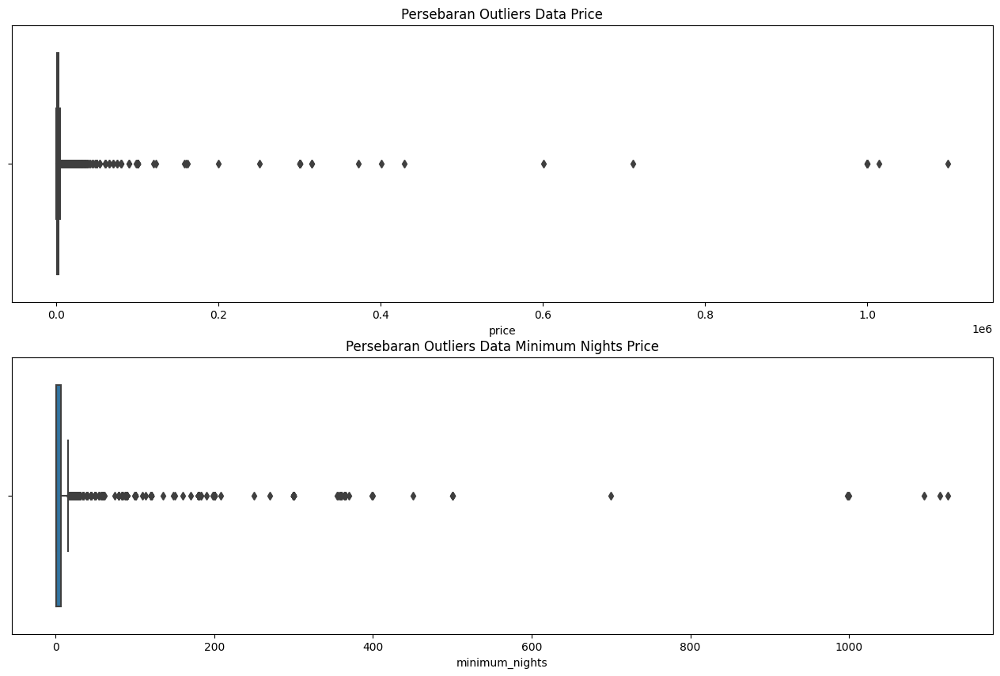

In [164]:
plt.figure(figsize=(16,10))
plt.subplot(2,1,1)
sns.boxplot(data= df, x='price')
plt.title('Persebaran Outliers Data Price')

plt.subplot(2,1,2)
sns.boxplot(data= df, x='minimum_nights')
plt.title('Persebaran Outliers Data Minimum Nights Price')

Seperti yang sudah dijelaskan sebelumnya, dari tabel statistik desckiptif dapat diketahui ada data yang tidak normal dan outliers.
Pada step ini kami akan melakukan pengecekan lebih dalam untuk data-data outlier.

Bedasarkan tabel dan visualisai di atas terdapat beberapa kolom yang memiliki kejanggalan :
1. kolom **price** terdapat data yang terisi 0. Dataframe ini berisikan terkait penyewaan properti di airbnb. Sehingga tidak mungkin ada properti yang disewakan secara gratis. Maka kami perlu mengubah data price tersebut. Kemudian pada kolom ini, data harga min dengan max memiliki perbedaan yang sangat signifikan, harga properti max tersebut terlalu mahal untuk disewakan per harinya.
2. kolom **minimum_nights** min adalah 1 hari dan max 1125. Terjadi perbedaan signifikan antara data min dengan max. Data max properti tersebut minimal per malam disewakanya terlalu lama.

**Price**

Pada tahap ini, kami akan memanipulasi data pada kolom Price. Secara domain knowledge harga(price) biasanya dipengaruhi oleh lokasi dan tipe kamar yang disewa. Sehingga kami akan melakukan pengkategorian harga ditiap daerah dan ditiap tipe kamar.

In [165]:
# mencari data dengan price 0
df[df['price']==0]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,0,1,0,NaT,0.0,1,0,0


In [166]:
# melakukan groupby berdasarkan neighbourhood & room_type
desc_price = df.groupby(by=['neighbourhood','room_type'])[['price']].describe()
desc_price

price                                     \
                                 count         mean           std     min   
neighbourhood   room_type                                                   
Bang Bon        Entire home/apt    2.0  1600.000000    565.685425  1200.0   
                Private room       3.0  1440.666667   1033.189883   790.0   
Bang Kapi       Entire home/apt  124.0  1586.911290   2367.583087   346.0   
                Hotel room         1.0   600.000000           NaN   600.0   
                Private room     132.0  4558.227273  37289.041321   350.0   
...                                ...          ...           ...     ...   
Wang Thong Lang Shared room        3.0  4816.666667   6683.250207   350.0   
Yan na wa       Entire home/apt  120.0  3491.175000   8249.440265   400.0   
                Hotel room         8.0  7183.125000   5010.874387   990.0   
                Private room      69.0  2211.318841   3433.398940   418.0   
                Shared room        3.0  1050.000000    301.620623   715.0   

                                                                   
                                    25%     50%     75%       max  
neighbourhood   room_type                                          
Bang Bon        Entire home/apt  1400.0  1600.0  1800.0    2000.0  
                Private room      845.0   900.0  1766.0    2632.0  
Bang Kapi       Entire home/apt   650.0   900.0  1590.0   20000.0  
                Hotel room        600.0   600.0   600.0     600.0  
                Private room      587.5   995.0  1612.5  429443.0  
...                                 ...     ...     ...       ...  
Wang Thong Lang Shared room       975.0  1600.0  7050.0   12500.0  
Yan na wa       Entire home/apt  1180.0  1668.5  3446.0   75000.0  
                Hotel room       2866.0  7943.0  9393.0   15243.0  
                Private room      935.0  1090.0  1800.0   22000.0  
                Shared room       925.0  1135.0  1217.5    1300.0  

[168 rows x 8 columns]

In [167]:
# melihat deskriptif statistik mean dan median dari neighbourhood : Vadhana dan room_type : Hotel room	
desc_price.loc['Vadhana']

price                                                     \
                  count         mean           std    min      25%     50%   
room_type                                                                    
Entire home/apt  1451.0  4699.071675  39426.967572  350.0  1450.00  2100.0   
Hotel room        105.0  3928.019048   4702.206583    0.0  1126.00  2414.0   
Private room      544.0  4251.108456  13550.571082  350.0  1023.75  1796.5   
Shared room        53.0   793.226415    674.628092  350.0   405.00   565.0   

                                    
                    75%        max  
room_type                           
Entire home/apt  3495.0  1100000.0  
Hotel room       5000.0    24390.0  
Private room     3463.0   250344.0  
Shared room       873.0     4000.0

Pada tipe kamar Hotel room terlihat bahwa mean : 3928.019048 dan 50%(median) : 2414.0 nilainya berbeda jauh. Maka persebaran datanya tidak terdistribusi normal. Agar lebih meyakinkannya lagi, akan kami uji statistik menggunakan Saphiro Wilk.

In [168]:
# normality test
vad_HotelRoom = df[(df['neighbourhood']=='Vadhana') & (df['room_type']=='Hotel room')]

stat, pvalue = shapiro(vad_HotelRoom['price'])
pvalue

if pvalue > 0.05 :
    print(f'pvalue ={pvalue}. pvalue > 0.05 Gagal menolak Ho. Kita anggap data terdistribusi normal')
else:
    print(f'pvalue ={pvalue}. pvalue < 0.05 Berhasil menolak Ho. Kita anggap data terdistribusi tidak normal')

# digunakan untuk memastikan lagi, bahwa datanya memang teristribusi tidak normal

pvalue =1.1230565902155959e-14. pvalue < 0.05 Berhasil menolak Ho. Kita anggap data terdistribusi tidak normal


Dari hasil uji statistik normality test di atas. Ditemukan bawaha Persebaran Harga AirBnb di Vadhana dengan Tipe Kamar Hotel terlihat tidak terdistribusi normal. Maka langkah yang diambil untuk mengisi data price 0 akan menggunakan median.

In [169]:
# mencari median dari price dengan kondisi Vadhana & Hotel room
vad_HotelRoom['price'].median()

2414.0

In [170]:
# mengubah kolom price : 0 dengan median

# mencari index price : 0 
index_price_0 = df.loc[df['price']==0].index

# mengisi kolom price : 0 menjadi median
df['price'] = df['price'].replace({0:vad_HotelRoom['price'].median()})

# memastikan bahwa nilai price sudah berubah
df.loc[index_price_0]


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,2414,1,0,NaT,0.0,1,0,0


Setelah handling price yang 0, pada tahap ini kami coba dilakukan handling harga price yang outliers

In [171]:
# Hitung Q1 dan Q3
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)

# Hitung IQR
IQR = Q3 - Q1

# Hitung batas atas dan batas bawah outlier
upper_bound = Q3 + 1.5 * IQR
lower_bound = Q1 - 1.5 * IQR

# Temukan outlier
outliers = df[(df['price'] < lower_bound) | (df['price'] > upper_bound)]

len(outliers)

1403

In [172]:
# persentase jumlah outliers
len(outliers)/ df.shape[0] * 100

8.849501703040243

Dikarenakan jumlah ouliers pada kolom price mencapai 8% dari data, maka kami memutuskan untuk tidak menghapus seluruh data price yang outliers.

Kemudian kami juga melakukan research pada website airbnb, range harga penginapan di Bangkok. Setelah kami telusuri ternyata memang ada penginapan yang harga sewa per kamarnya mencapai 1.000.000 bath

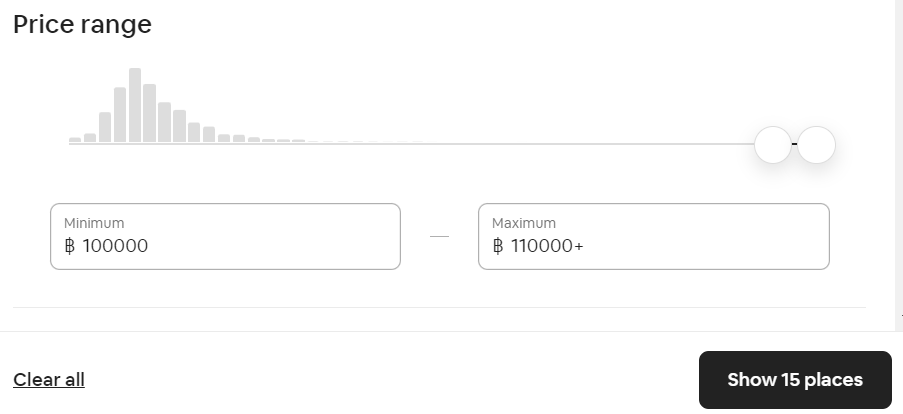
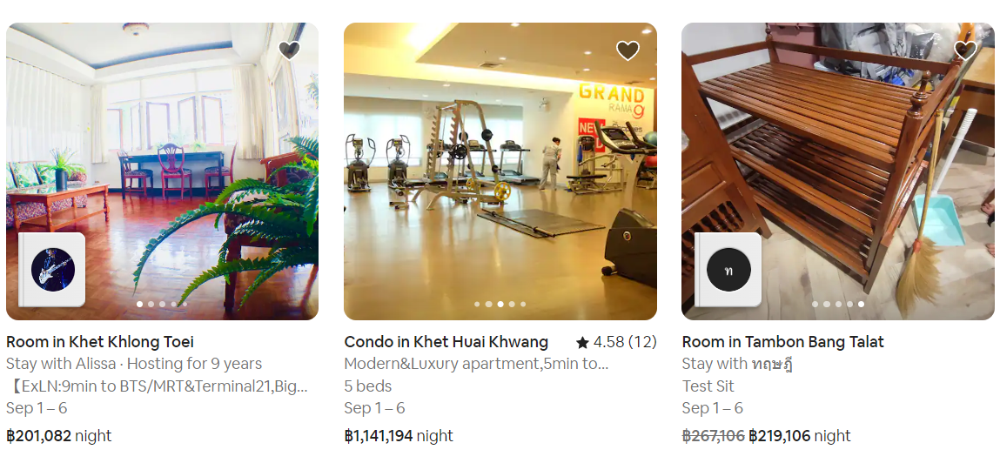
sumber : <www.airbnb.co.id>

Sehingga kami tidak jadi menghapus data price yang outlier pada analisis ini

**minimum_nights**

Kami akan menghapus baris dengan minimum_nights lebih dari 365. Dikarenakan pada website airbnb, seseorang hanya dapat menginap maksimal 12 bulan. Sehingga tidak mungkin jumlah minimum_nightsnya lebih dari 365

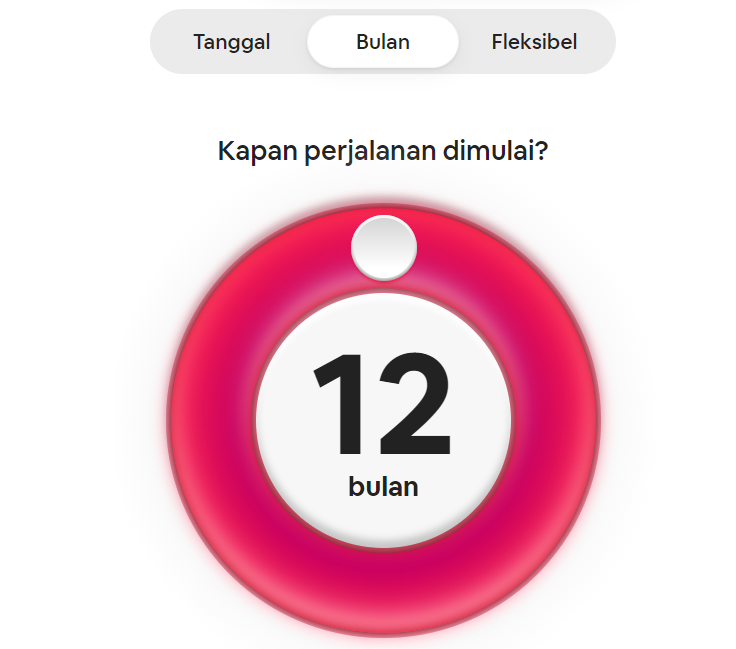

sumber : <www.airbnb.co.id>

In [173]:
# index data minimum_nights > 365
oulier_MinNight = df[df['minimum_nights']>365]
oulier_MinNight.index

Index([   61,   324,  1134,  1200,  1592,  1833,  3694,  4194,  7986,  8608,
       10153, 10644, 11243, 11416, 11524],
      dtype='int64')

In [174]:
# persentase jumlah kamar yang akan di hapus
len(oulier_MinNight.index) / df.shape[0] * 100

0.09461334678945377

Persentase data yang terhapus juga cenderung kecil : 0.09%. Sehingga diharapkan dengan menghapus data ini tidak mempengaruhi hasil analisa kita.

In [175]:
# menghapus barisnya dan membuat dataframe baru
df_clean = df.drop(oulier_MinNight.index, axis=0)
df_clean.head()

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaT,0.00,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaT,0.00,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaT,0.00,3,365,0


In [176]:
# melihat jumlah data setelah dicleaning
num_rows, num_cols = df_clean.shape
print(f"Jumlah Baris: {num_rows}, Jumlah Kolom: {num_cols}")

Jumlah Baris: 15839, Jumlah Kolom: 17


### Menghapus kolom yang tidak digunakan

kolom Unnamed:0 isinya sama dengan index, sehingga kolom ini tidak diperlukan lagi dan kami drop

In [177]:
# Drop kolom Unnamed:0 secara permanen
df_clean.drop(columns='Unnamed: 0', inplace=True)

In [178]:
df_clean.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaT,0.00,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaT,0.00,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaT,0.00,3,365,0


Pada tahap ini kami juga akan menentukan kolom apa saja yang akan digunakan : 
<br>
Kolom yang akan kami gunakan :
1. id : kolom ini digunakan untuk mengetahui jumlah dari properti tersebut
2. neighbourhood : kolom ini digunakan untuk mengkategorikan daerah di Bangkok
3. latitude & longtitude : kolom ini digunakan untuk memberikan tanda pada properti di maps
4. room_type : kolom ini dignakan untuk mengkategorikan tipe kamar yang diminati
5. price : kolom ini digunakan untuk melihat harga yang ada
6. minimum_nights : kolom ini digunakan untuk melihat hubungan dengan properti laku/ tidak
7. number_of_reviews : kolom ini digunakan untuk melihat hubungan dengan properti laku/ tidak
8. availability_365 : kolom ini digunakan untuk menentukan poperti mana yang laku/ tidak

Kolom yang akan kami drop :
1. name : kolom ini tidak digunakan karena pada kolom ini terlalu unique sehingga sulit untuk dikelompokkan
2. host id, host_name, calculated_host_listings_count : kolom ini tidak digunakan karena kami tidak melakukan analisa terhadap pemilik properti
3. last_review : kolom ini tidak digunakan karena hanya berisi tanggal terakhir properti tersebut diulas, sehingga tidak berpengaruh terhadap properti tersebut laku/ tidak
4. reviews_per_month & number_of_reviews_ltm : kolom ini tidak digunakan karena mirip dengan kolom number_of_reviews, sehingga yang kami ambil hanya salah satunya saja

In [179]:
# drop kolom yang tidak digunakan
df_clean = df_clean.drop(columns=['name', 'host_id', 'host_name', 'calculated_host_listings_count', 'last_review', 'reviews_per_month', 'number_of_reviews_ltm'])
df_clean.head()

,id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,availability_365
0,27934,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,353
1,27979,Bang Na,13.66818,100.61674,Private room,1316,1,0,358
2,28745,Bang Kapi,13.75232,100.62402,Private room,800,60,0,365
3,35780,Din Daeng,13.78823,100.57256,Private room,1286,7,2,323
4,941865,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,365


In [180]:
# jumlah baris & kolom data yang digunakan
print(f'jumlah baris : {df_clean.shape[0]}')
print(f'jumlah kolom : {df_clean.shape[1]}')

jumlah baris : 15839
jumlah kolom : 9


# **Analisis Data**

Dalam melihat karakteristik properti yang paling banyak diminati oleh penyewa, kami menggunakan kolom **'availability_365'** untuk menentukan properti mana yang paling laku. Sehingga semakin kecil availabilitynya, properti tersebut semakin laku. Kami mengidentifikasinya properti yang paling laku adalah properti yang tersewa 90%nya dalam 1 tahun. Minimal properti tersebut tidak ada yang menyewa sama sekali selama 3 hari per bulannya atau 36 hari per tahunnya. Sehingga kami akan menyaring(filter) data berdasarkan jumlah availabilitynya yang kurang dari sama dengan 36 hari.
<br>
Kami menetapkan target tingkat okupansi sebesar 90 persen karena hal ini penting dalam rangka mencari properti yang **sangat diminati**. Dari sini, kami akan melakukan analisis mendalam untuk mengidentifikasi karakteristik utama dari properti yang memiliki performa laku tersebut. Fokus kami adalah untuk memahami aspek-aspek yang akan mengoptimalkan pendapatan perusahaan.

Dari sini akan muncul pertanyaan :
1. Bagaimana range harga untuk properti yang laku?
2. Berapa harga yang paling cocok untuk diterapkan di aribnb bangkok?

In [181]:
# data properti yang paling diminati
df_full_book = df_clean[df_clean['availability_365'] <= 36]

In [182]:
# persentase properti yang laku dari seluruh data
df_full_book.shape[0]/ df_clean.shape[0] * 100

7.525727634320349

In [183]:
# harga yang paling murah & paling mahal
display(df_full_book['price'].min(), df_full_book['price'].max())

305

100194

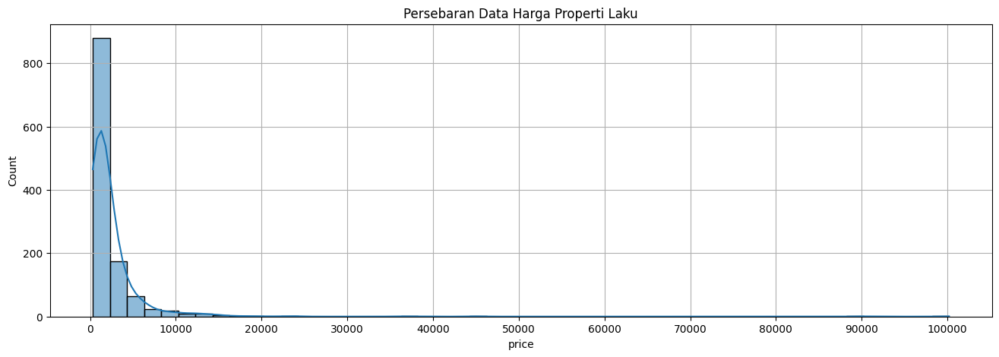

In [184]:
plt.figure(figsize=(16,5))
sns.histplot(data=df_full_book, x='price', bins=50, kde=True)
plt.title('Persebaran Data Harga Properti Laku')
plt.grid(True)
plt.xticks(ticks=[0,10000,20000,30000,40000,50000,60000,70000,80000,90000,100000])

plt.show()

In [185]:
display(df_full_book['price'].describe()['25%'], df_full_book['price'].describe()['75%'])

900.0

2424.25

In [186]:
df_full_book['price'].median()

1250.0

Dari hasil statistik deskriptif dan visualisasi yang kita cari, kita menemukan beberapa hal untuk menjawab pertanyaan sebelumnya :
1. Bagaimana range harga untuk properti yang laku?
    - Distribusi harga tidak terdisribusi normal dan cenderung right skewed, sehingga harganya cenderung pada rentang 900 bath sampai 2.424 bath
    - Harga minimumnya adalah : **305 bath**
    - Harga maximumnya adalah : **45.000 bath** 
<br>
2. Berapa harga yang paling cocok untuk diterapkan di aribnb bangkok?
    - Distribusi harga terbanyak pada properti yang laku di Bangkok berada di harga **1.200 bath**
    - Namun pertanyaan ini belum sepenuhnya terjawab, dikarenakan berdasarkan domain knowledge dan  website airbnb.co.id, harga dari tiap tipe kamar berbeda-beda. Maka, kita coba cek lebih dalam persebaran price di setiap tipe kamar

Berikut adalah tampilan pengkategorian harga bedasarkan tipe kamar
<br>
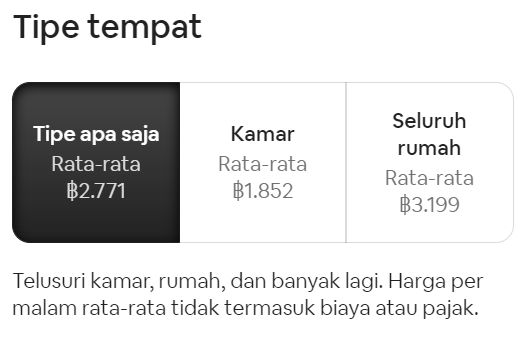
<br>
sumber: <www.airbnb.co.id>

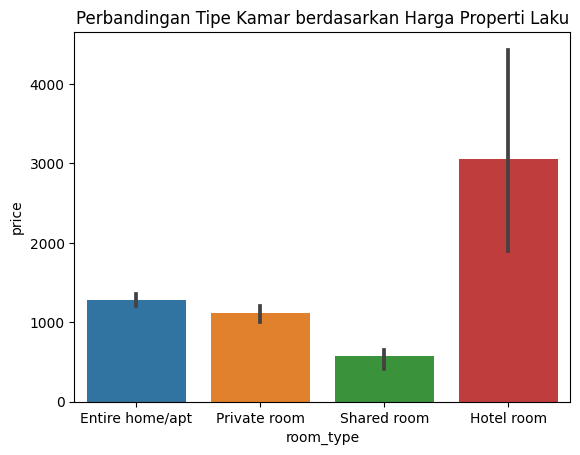

In [187]:
sns.barplot(data=df_full_book, x='room_type', y='price', estimator=np.median)
plt.title('Perbandingan Tipe Kamar berdasarkan Harga Properti Laku')

plt.show()

Berdasarkan grafik di atas, terlihat ada perbedaan persebaran harga antara 1 tipe kamar dengan tipe lainnya.  Agar lebih yakin, kami akan melakukan tes statistik menggunakan Kruskal Wallis.
<br>
Kruskal Wallis digunakan untuk menguji perbandingan tipe kamar (4 kategori) berpengaruh terhadap harga / tidak. 

In [188]:
stat, pvalue = kruskal(
    df_full_book[df_full_book['room_type']=='Entire home/apt']['price'],
    df_full_book[df_full_book['room_type']=='Hotel room']['price'],
    df_full_book[df_full_book['room_type']=='Private room']['price'],
    df_full_book[df_full_book['room_type']=='Shared room']['price']
)

if pvalue<=0.05:
    print(f'Pvalue : {pvalue}, Tolak Ho')
else:
    print(f'Pvalue : {pvalue}, Gagal menolak Ho')

Pvalue : 2.8571847415119163e-14, Tolak Ho


Setelah dilakukan tes statistik, hasinya pvalue < 0.05 (Tolak Ho). Sehingga kita mempunyai cukup bukti untuk mengatakan bahwa minimal salah satu tipe kamar memiliki harga yang berbeda. Ada pengaruh signifikan antara tipe kamar dengan harga kamar.

Maka dari itu sekarang mari kita lihat, persebaran data harga(price) berdasarkan kategori tipe kamar(room_type).
<br>
Diharapkan kita bisa menjawab pertanyaan berikut :
1. Tipe kamar apa yang bisa disewa dengan harga murah dan disewa dengan harga mahal untuk properti yang laku?
2. Berapa harga yang cocok untuk setiap tipe kamar pada properti yang laku?

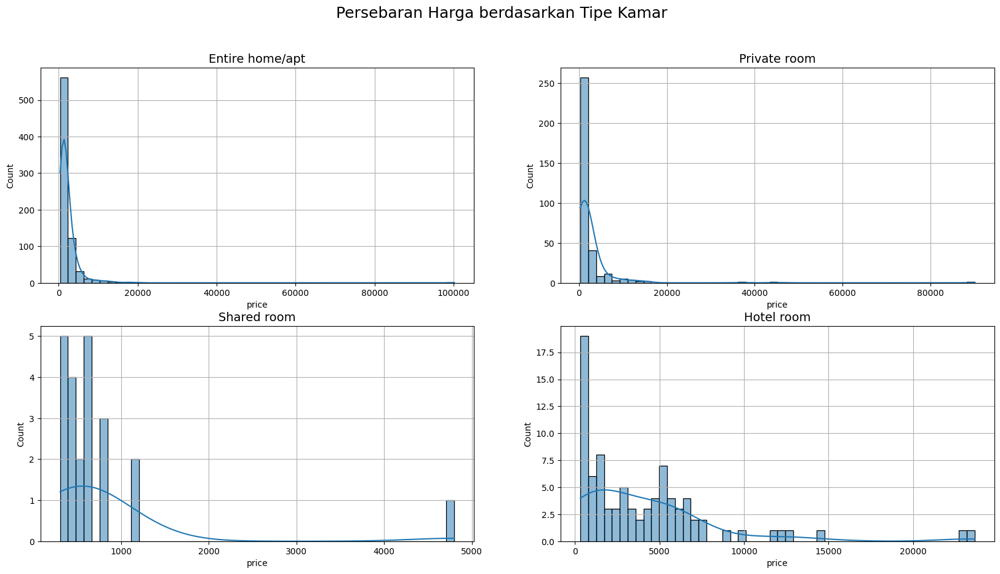

In [205]:
room_type_eh_a = df_full_book[df_full_book['room_type']== 'Entire home/apt']
room_type_pr = df_full_book[df_full_book['room_type']== 'Private room']
room_type_sr = df_full_book[df_full_book['room_type']== 'Shared room']
room_type_hr = df_full_book[df_full_book['room_type']== 'Hotel room']

plt.figure(figsize=(20,10))

plt.subplot(2,2,1)
sns.histplot(data=room_type_eh_a, x='price', bins=50, kde=True)
plt.title('Entire home/apt', size=14)
plt.grid(True)

plt.subplot(2,2,2)
sns.histplot(data=room_type_pr, x='price', bins=50, kde=True)
plt.title('Private room', size=14)
plt.grid(True)

plt.subplot(2,2,3)
sns.histplot(data=room_type_sr, x='price', bins=50, kde=True)
plt.title('Shared room', size=14)
plt.grid(True)

plt.subplot(2,2,4)
sns.histplot(data=room_type_hr, x='price', bins=50, kde=True)
plt.title('Hotel room', size=14)
plt.grid(True)

plt.suptitle('Persebaran Harga berdasarkan Tipe Kamar', size=18)

plt.show()

In [190]:
# pengecekan median harga dari masing-masing tipe kamar
df_clean.groupby(by='room_type')[['price']].median()

,price
room_type,
Entire home/apt,1536.0
Hotel room,1700.0
Private room,1212.0
Shared room,500.0


Berdasarkan grafik di atas kita dapat menjawab :
1. Tipe kamar apa yang bisa disewa dengan harga mahal dan disewa dengan harga murah untuk properti yang laku?
    - Harga pada tipe kamar memiliki range yang berbeda-beda. Range harga terendah berada pada tipe Shared Room (harga murah) dan range harga tertinggi berada pada tipe Private Room (harga mahal)
2. Berapa harga yang cocok untuk setiap tipe kamar pada properti yang laku?
    - Dalam menentukan harga yang cocok kami menggunakan nilai median, dikarenakan pusat persebaran harganya ada pada median (non parametrik). Kami juga memilih median agar hanya ada 1 nilai saja, sehingga harga yang cocok bisa disesuaikan asalkan tidak jauh dari nilai mediannya.
    - Harga sewa properti yang cocok untuk tipe kamar **Entire home/apt** adalah **1536 bath**, **Hotel room** adalah **1700 bath**, **Private room** adalah **1212** bath , **Shared room** adalah **500 bath**,


Dari grafik ini juga kita temukan bahwa persebaran harga sewa di setiap tipe kamar tidak terdistribusi normal dan right skewed. Hal ini menunjukkan properti penginapan di airbnb yang laku, cenderung terdisribusi di harga yang murah pada setiap tipenya. 

Selanjutnya, secara domain knowledge penyewaaan properti yang laku juga dipengaruhi oleh lokasinya. Berdasarkan <https://store.sirclo.com/blog/tips-bisnis-homestay/> disebutkan bahwa jika Anda ingin melakukan bisnis penginapan, maka syarat utamanya adalah memilih lokasi yang potensial.

Maka kita akan coba melihat:
1. Persebaran properti yang laku ini ada daerah mana saja ?
2. Dimana letak daerah yang paling laku?

In [191]:
# grouping jumlah properti berdasarkan daerah
jml_properti_daerah = df_full_book.groupby('neighbourhood')[['id']].count().reset_index().rename(columns={'id':'jumlah properti'})
jml_properti_daerah.sort_values('jumlah properti', ascending=False)

display(jml_properti_daerah.sort_values('jumlah properti', ascending=False).head(), jml_properti_daerah.sort_values('jumlah properti', ascending=False).tail())

,neighbourhood,jumlah properti
17,Huai Khwang,190
44,Vadhana,164
21,Khlong Toei,133
7,Bang Rak,79
30,Phra Nakhon,70


,neighbourhood,jumlah properti
2,Bang Khen,2
37,Saphan Sung,1
4,Bang Khun thain,1
41,Thawi Watthana,1
19,Khlong Sam Wa,1


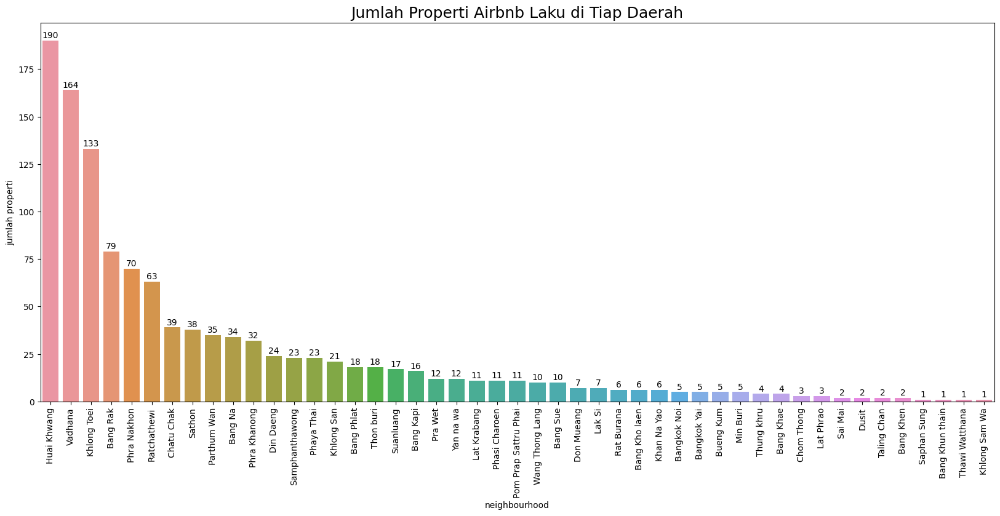

In [192]:
# visualisasi jumlah properti tiap daerah dengan barchart

plt.figure(figsize=(20,8))
ax = sns.barplot(data=jml_properti_daerah.sort_values('jumlah properti', ascending=False) , x='neighbourhood', y='jumlah properti',)
plt.xticks(rotation=90)
plt.title ('Jumlah Properti Airbnb Laku di Tiap Daerah', size=18)


for bar in ax.patches:
  ax.annotate(format(bar.get_height(), '.0f'),
                   (bar.get_x() + bar.get_width() / 2,
                   bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 6),
                   textcoords='offset points')

plt.show()

In [193]:
# menampilkan lokasi persebaran properti yang paling laku menggunakan maps dan terdapat heatmap

bangkok_map = folium.Map(location=[13.779072059749991, 100.50668136305889], zoom_start=11)

# membaca GeoJSON dengan geopandas
gdf = gpd.read_file('Bangkok-districts.geojson', encoding='utf-8')

chor_daerah = folium.Choropleth(
                  geo_data=gdf,
                  data=jml_properti_daerah,                    
                  columns=['neighbourhood','jumlah properti'],     
                  key_on= 'feature.properties.dname_e',
                  legend_name='Persebaran Sewa Properti Terlaku di Bangkok',
                  fill_color='YlGn')


# memasukkan choropleth ke map
chor_daerah.add_to(bangkok_map)

# membuat DataFrame untuk daerah, latitude, dan longitude
data_daerah = pd.DataFrame({
    'daerah': [
        'Bang Na', 'Ratchathewi', 'Bang Kapi', 'Din Daeng', 'Bang Kho laen', 'Rat Burana', 'Chatu Chak', 'Khlong San',
        'Bang Rak', 'Phaya Thai', 'Sathon', 'Khlong Toei', 'Vadhana', 'Sai Mai', 'Lat Krabang', 'Bangkok Yai', 'Wang Thong Lang',
        'Huai Khwang', 'Phasi Charoen', 'Bang Sue', 'Nong Chok', 'Phra Khanong', 'Thawi Watthana', 'Pra Wet', 'Phra Nakhon',
        'Thon buri', 'Yan na wa', 'Suanluang', 'Don Mueang', 'Dusit', 'Lak Si', 'Parthum Wan', 'Samphanthawong', 'Bueng Kum',
        'Bang Phlat', 'Saphan Sung', 'Min Buri', 'Khan Na Yao', 'Khlong Sam Wa', 'Bang Khen', 'Lat Phrao', 'Chom Thong',
        'Bangkok Noi', 'Pom Prap Sattru Phai', 'Nong Khaem', 'Thung khru', 'Bang Khae', 'Bang Khun thain', 'Taling Chan', 'Bang Bon'
    ],
    'latitude': [
        13.663912979831407, 13.758389057597544, 13.762557856652842, 13.761716125165067, 13.690452619437254, 13.672332385081916, 13.817388272940084, 13.728743463210657,
        13.726707222589178, 13.781293835796166, 13.715596925945675, 13.719134315354857, 13.73097840792555, 13.906273907816226, 13.752840184712449, 13.740170236288822, 13.787772307686327,
        13.764188524053, 13.72514571680185, 13.829237056153955, 13.85876920628235, 13.69044492633336, 13.787947314957755, 13.699682202175866, 13.7579605864102, 
        13.709041840524433, 13.694759242762924, 13.719953652664493, 13.92644041361646, 13.78259040502067, 13.892217708499459, 13.741902978324154, 13.738655144378313, 13.806148204846249,
        13.78509676097364, 13.766036283031388, 13.817113881185463, 13.829464275758033, 13.861095853662295, 13.865371182244862, 13.825213888891227, 13.699328806081295,
        13.756016773739574, 13.751645462247353, 13.705754772930197, 13.646962174372792, 13.711737688030729, 13.64252064053423, 13.781704291562582, 13.655606596829095
    ],
    'longitude': [
        100.61383948998147, 100.53381748534144, 100.6460465767284, 100.5552023592339, 100.5098263396647, 100.50832064485257, 100.55026735268815, 100.50141060898339,
        100.5286619192675, 100.544725715849, 100.5347184080576, 100.5668781566889, 100.58603465174498, 100.65579322636539, 100.79644708306012, 100.48397139243725, 100.60840292185588,
        100.57889448184083, 100.43724124890814, 100.5303504585055, 100.86419881457428, 100.60883992649703, 100.36317928071871, 100.67626348743873, 100.49381037019677,
        100.48482616512281, 100.53837589127549, 100.63159434472514, 100.59251369812893, 100.51598153431463, 100.56380168765398, 100.5343921544708, 100.51008770741011, 100.64655090977178,
        100.49521092888239, 100.67979961700456, 100.73637287557806, 100.67760111956362, 100.70466712058854, 100.61425642670854, 100.60753657966768, 100.46814393348987,
        100.46843657059597, 100.51157673776994, 100.34432448175355, 100.49593111081136, 100.40018254232146, 100.41336973367333, 100.42764233849884, 100.3845966201928
    ]
})

# menambahkan marker untuk setiap daerah
for idx, row in data_daerah.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']], popup=row['daerah']).add_to(bangkok_map)


bangkok_map

Untuk membantu memvisualisasikannya dalam peta, kami mengambil file geosjon distric bangkok dari : <https://github.com/pcrete/gsvloader-demo/blob/master/geojson/Bangkok-districts.geojson>

Dari visualisasi di atas dapat menjawab pertanyaan berikut :
1. Persebaran properti yang laku ini ada daerah mana saja ?
    - Berdasarkan barchart di atas, kita dapat mengetahui daerah yang paling laku berdasarkan dari jumlah properti yang terbanyak dan menempati urutan :
        - pertama adalah daerah **Huai Khwang** dengan 190 properti, 
        - kedua adalah daerah **Vadhana** dengan 164 properti, 
        - ketiga adalah daerah **Khlong Toei** dengan 133 properti.
2. Dimana letak daerah yang paling laku?
    - Jika kita lihat berdasarkan folium di atas, daerah yang paling laku pertama berada di tengah(central) dari kota Bangkok. Kemudian urutan kedua dan ketiga juga masih menempati posisi tengah namun cenderung ke bawah (selatan).

Dari visualisasi di atas kita juga mendapatkan jawaban, bahwa properti yang paling laku tersebar didaerah pusat/ tengah kota. Kemudian semakin ke pinggir kanan (timur) dan kiri (barat), semakin sedikit jumlah properti yang laku. Terdapat juga dalam maps terlihat ada daerah yang berwarna hitam. Hal tersebut menunjukkan bahwa daerah tersebut tidak memenuhi kriteria laku, yaitu minimal 90% properti tersebut tersewa selama setahun.
<br>
Sehingga kita juga mengetahui, bahwa potensi untuk membangun/ membeli properti untuk disewakan di airbnb paling tepat dilakukan di pusat kota (daerah yang berwana hijau pekat)

Selanjutnya kita akan melihat lebih dalam terkait tipe kamar dan harga yang paling cocok pada daerah tersebut. Di tahap ini, kami akan mempersempit menjadi 10 daerah yang paling potensial.

In [194]:
# memfilter 10 daerah potensial (diurutkan berdasarkan properti terbanyak)
jml_properti_daerah = jml_properti_daerah.sort_values('jumlah properti', ascending = False)
top10_neighbourhood = jml_properti_daerah['neighbourhood'][:10]
df_top10 = df_full_book[df_full_book['neighbourhood'].isin(top10_neighbourhood)]

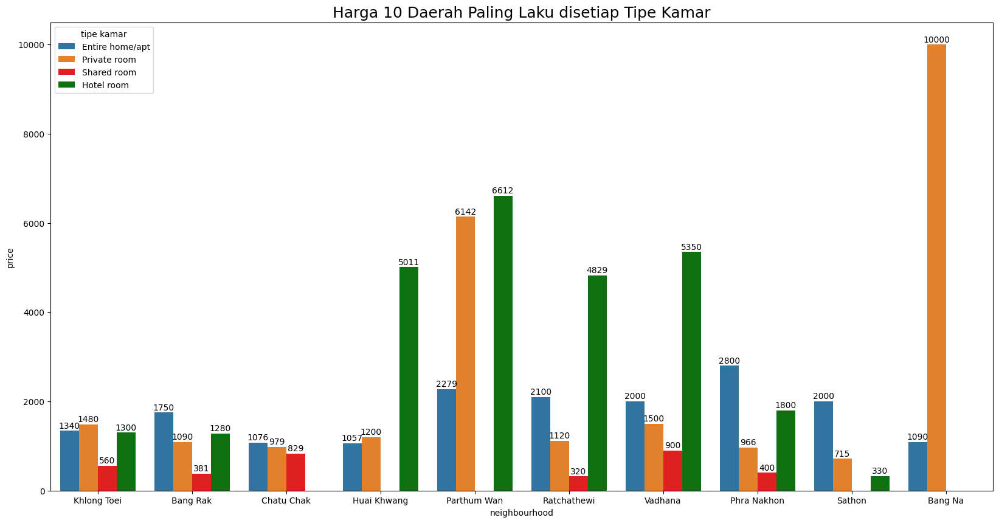

In [195]:
plt.figure(figsize=(20,10))

basic_palette = sns.color_palette()

custom_palette = list(basic_palette)
custom_palette[2] = 'red'  
custom_palette[3] = 'green' 

ax = sns.barplot(data=df_top10, x='neighbourhood', y='price', hue='room_type', errorbar=('ci', 0), estimator=np.median, 
                 palette=custom_palette)
plt.title('Harga 10 Daerah Paling Laku disetiap Tipe Kamar', size=18)

for bar in ax.patches:
  ax.annotate(format(bar.get_height(), '.0f'),
                   (bar.get_x() + bar.get_width() / 2,
                   bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 6),
                   textcoords='offset points')

plt.legend(title='tipe kamar')

plt.show()

In [196]:
# membuat pivot tabel harga yang cocok berdasarkan daerah dan tipe kamar
df_nrp = df_full_book.groupby(['neighbourhood','room_type'])[['price']].median().reset_index()

filtered_dfs = []
for neighbourhood in top10_neighbourhood:
    filtered_df = df_nrp[df_nrp['neighbourhood'] == neighbourhood].pivot_table(index='neighbourhood', columns='room_type', values='price')
    filtered_dfs.append(filtered_df)

result_df = pd.concat(filtered_dfs)
result_df['rank'] = range(1, 11)
result_df

room_type,Entire home/apt,Hotel room,Private room,Shared room,rank
neighbourhood,,,,,
Huai Khwang,1057.0,5011.0,1200.0,NaN,1
Vadhana,2000.0,5350.0,1500.0,900.0,2
Khlong Toei,1340.0,1300.0,1480.0,560.0,3
Bang Rak,1750.0,1280.0,1090.0,381.0,4
Phra Nakhon,2800.0,1800.0,966.0,400.0,5
Ratchathewi,2100.0,4829.0,1120.0,320.0,6
Chatu Chak,1076.0,NaN,979.0,829.0,7
Sathon,2000.0,330.0,715.0,NaN,8
Parthum Wan,2279.0,6612.0,6142.0,NaN,9


Berdasarkan grafik di atas, kita mengetahui bahwa :
- Daerah dengan properti paling laku pada peringkat pertama adalah Huai Khwang. Pada Huai Khwang kita dapat melihat bahwa properti dengan jenis entire home/apt dan private room mirip dengan daerah lainnya. Hotel room memiliki harga yang lumayan tinggi dibandingkan dengan wilayah lainnya. Namun, untuk properti dengan tipe shared room kurang cocok di daerah ini (tidak ada properti share room yang masuk ke dalam kategori laku).
- Daerah Bang Na, menempati peringkat ke 10. Namun, secara grafik daerah ini menunjukkan harga yang paling mahal (10.000 bath) diantara daerah lainnya. Harga yang termahal ini masuk ke dalam tipe private room.
- Daerah Parthum Wan, menempati pernginkat ke 9. Namun, memiliki 2 tipe kamar dengan harga yang tergolong tinggi dibandingkan dengan daerah lainnya. Pada daerah ini, jika ingin melakukan bisnis properti dapat mempertimbangkan dengan tipe hotel room dan private room.
- Beberapa daerah memiliki karakteristik (tipe kamar dan harga) yang berbeda-beda. Sehingga perlakuan dalam mengabil keputusan harus didasarkan oleh karakteristik dari daerah itu sendiri. 

Dengan grafik ini kita juga sudah dapat menjawab pertanyaan di paling awal, yaitu :
1. Berapa harga yang paling cocok untuk diterapkan di aribnb bangkok?
    - Kita dapat melihat dengan detail harga yang cocok berdasarkan Daerah dan Tipe Kamar pada tabel dan grafik di atas. Contohnya di Huai Khwang untuk tipe **Entire home/apt** yang cocck adalah **1057 bath**, untuk tipe **Hotel room**	yang cocok adalah **5011 bath**, untuk tipe **Private room** yang cocok adalah **1200 bath**.

Setelah kita menemukan harga yang cocok untuk tiap daerah dan tiap tipe kamarnya. Sekarang kami akan mempersempit data yang akan diolah berdasarkan 5 daerah dan harga yang terbaik, yaitu pada daerah : Huai Khwang , Vadhana, Ratchathewi, Parthum Wan, dan Bang Na.
Sekarang kita akan melihat bagaimana persebaran / jumlah tipe kamar yang paling banyak laku di 5 daerah ini. Pada 5 daerah ini memiliki jumlah properti yang laku berbeda-berda. Dikarenakan daerah ini sudah termasuk daerah yang paling laku, maka kami akan tampilkan menggunakan proporsi atau persentase jumlah tipe kamar di setiap daerahnya.

In [197]:
df_top5 = df_top10[(df_top10['neighbourhood']=='Huai Khwang') |
                   (df_top10['neighbourhood']=='Vadhana') |
                   (df_top10['neighbourhood']=='Ratchathewi') |
                   (df_top10['neighbourhood']=='Parthum Wan') |
                   (df_top10['neighbourhood']=='Bang Na')] 

room_counts = df_top5.groupby(['neighbourhood', 'room_type']).size().unstack(fill_value=0)
room_counts['Entire home/apt %'] = room_counts['Entire home/apt']/ (room_counts['Entire home/apt']+ room_counts['Hotel room'] + room_counts['Private room'] + room_counts['Shared room'])*100
room_counts['Private room %'] = room_counts['Private room']/ (room_counts['Entire home/apt']+ room_counts['Hotel room'] + room_counts['Private room'] + room_counts['Shared room'])*100
room_counts['Hotel room %'] = room_counts['Hotel room']/ (room_counts['Entire home/apt']+ room_counts['Hotel room'] + room_counts['Private room'] + room_counts['Shared room'])*100
room_counts['Shared room %'] = room_counts['Shared room']/ (room_counts['Entire home/apt']+ room_counts['Hotel room'] + room_counts['Private room'] + room_counts['Shared room'])*100

room_counts = room_counts.drop(columns = ['Entire home/apt', 'Hotel room', 'Private room', 'Shared room'] )
room_counts = room_counts.T
room_counts


neighbourhood,Bang Na,Huai Khwang,Parthum Wan,Ratchathewi,Vadhana
room_type,,,,,
Entire home/apt %,73.529412,86.315789,71.428571,55.555556,64.024390
Private room %,26.470588,8.947368,25.714286,23.809524,25.000000
Hotel room %,0.000000,4.736842,2.857143,19.047619,9.756098
Shared room %,0.000000,0.000000,0.000000,1.587302,1.219512


Text(0.5, 0.98, 'Persentase Jumlah Kamar berdasarkan Tipe Kamar')

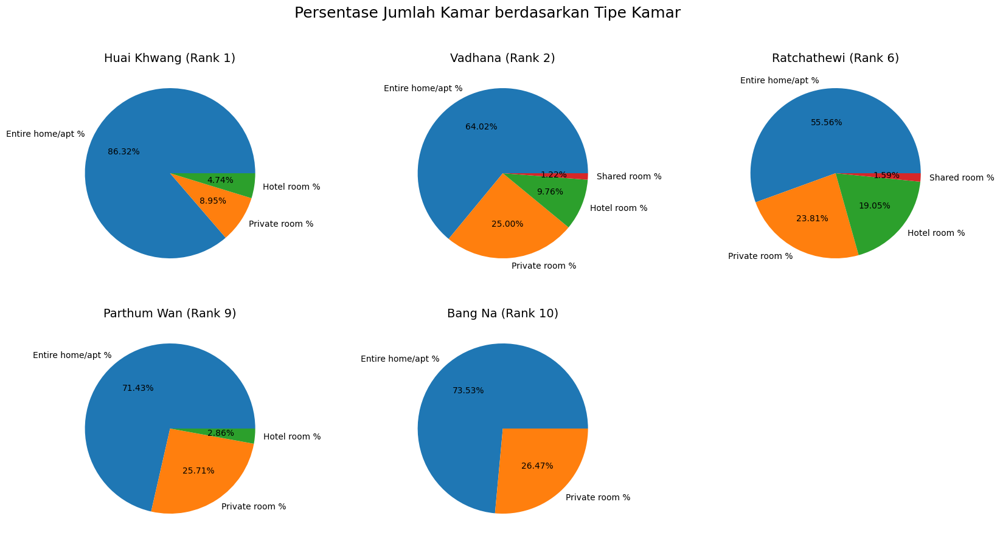

In [207]:
plt.figure(figsize=(20,10))
# Huai Khwang , Vadhana, Ratchathewi, Parthum Wan, Bang Na

plt.subplot(2,3,1)
HuaiKhwang = room_counts['Huai Khwang'].loc[room_counts['Huai Khwang'] != 0]
plt.pie(x=HuaiKhwang, 
        labels = HuaiKhwang.index,
        autopct='%.2f%%');
plt.title('Huai Khwang (Rank 1)', size=14)

plt.subplot(2,3,2)
Vadhana = room_counts['Vadhana'].loc[room_counts['Vadhana'] != 0]
plt.pie(x=Vadhana, 
        labels = Vadhana.index,
        autopct='%.2f%%');
plt.title('Vadhana (Rank 2)', size=14)

plt.subplot(2,3,3)
Ratchathewi = room_counts['Ratchathewi'].loc[room_counts['Ratchathewi'] != 0]
plt.pie(x=Ratchathewi, 
        labels = Ratchathewi.index,
        autopct='%.2f%%');
plt.title('Ratchathewi (Rank 6)', size=14)

plt.subplot(2,3,4)
ParthumWan = room_counts['Parthum Wan'].loc[room_counts['Parthum Wan'] != 0]
plt.pie(x=ParthumWan, 
        labels = ParthumWan.index,
        autopct='%.2f%%');
plt.title('Parthum Wan (Rank 9)', size=14)

plt.subplot(2,3,5)
BangNa = room_counts['Bang Na'].loc[room_counts['Bang Na'] != 0]
plt.pie(x=BangNa, 
        labels = BangNa.index,
        autopct='%.2f%%');
plt.title('Bang Na (Rank 10)', size=14)

plt.suptitle('Persentase Jumlah Kamar berdasarkan Tipe Kamar', size=18)


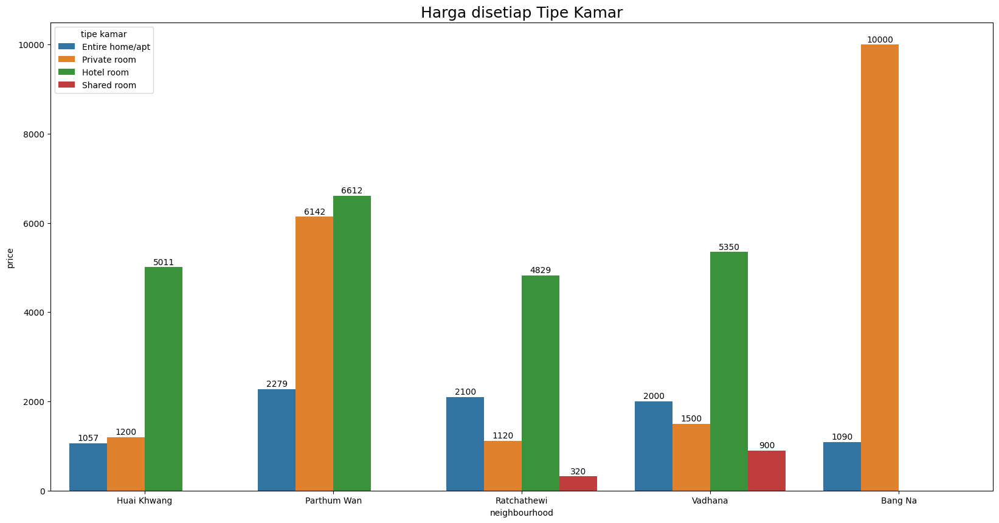

In [199]:
plt.figure(figsize=(20,10))
ax = sns.barplot(data=df_top5, x='neighbourhood', y='price', hue='room_type', errorbar=('ci', 0), estimator=np.median)
plt.title('Harga disetiap Tipe Kamar', size=18)

for bar in ax.patches:
  ax.annotate(format(bar.get_height(), '.0f'),
                   (bar.get_x() + bar.get_width() / 2,
                   bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 6),
                   textcoords='offset points')

plt.legend(title='tipe kamar')

plt.show()

Berdasarkan 2 grafik di atas, kita menemukan insight baru yaitu :
1. Pada daerah Huwai Khwang: 
    - Proporsi jumlah tipe kamar yang paling besar adalah Entire home/apt, namun secara harga yang ditawarkan cenderung paling rendah (1057 bath). 
    - Sedangkan pada tipe kamar hotel room dengan proporsi paling kecil, secara harga yang ditawarkan cenderung paling tinggi (5011 bath)
2. Pada daerah Vadhana:
    - Proporsi jumlah tipe kamar yang paling besar adalah Entire home/apt, secara harga yang ditawarkan masih masuk ke posisi ke dua (2000 bath). 
    - Tipe kamar hotel room dengan proporsi kedua paling kecil, secara harga yang ditawarkan cenderung paling tinggi (5350 bath). 
    - Pada daerah ini merupakan tipe Shared room dengan harga paling tinggi
3. Pada daerah Ratchathewi: 
    - Proporsi jumlah tipe kamar yang paling besar adalah Entire home/apt, secara harga yang ditawarkan masih masuk ke posisi ke dua (2100 bath). 
    - Tipe kamar hotel room dengan proporsi kedua paling kecil (namun tidak terlalu jauh dengan private room), harga yang ditawarkan paling tinggi (5350 bath)
4. Pada daerah Prathum Wan:
    - proporsi jumlah tipe kamar yang paling besar adalah Entire home/apt, secara harga yang ditawarkan paling rendah (1057 bath). 
    - Tipe kamar Hotel room, proporsi paling rendah , harga yang ditawarkan paling tinggi (5011 bath). 
    - Pada daerah ini merupakan tipe Hotel room dan Entire home/apt dengan harga paling tinggi
5. Pada daerah Bang Na:
    - proporsi jumlah tipe kamar paling besar adalah Entire home/apt dan secara harga yang ditawarkan paling kecil (1090 bath). 
    - Tipe kamar private room, proporsi paling rendah dan harga yang paling tinggi (10000 bath). 
    - Pada daerah ini merupakan tipe Private room dengan harga paling tinggi.

Kita akan melihat lokasi propertinya dengan detail pada 5 daerah ini (Huai Khwang , Vadhana, Ratchathewi, Parthum Wan, Bang Na) melalui folium di bawah ini.

In [200]:
# visualisasi tipe kamar tiap 5 daerah potensial
bangkok_map = folium.Map(location=[13.779072059749991, 100.50668136305889], zoom_start=14)

# Membaca GeoJSON dengan geopandas
gdf = gpd.read_file('Bangkok-districts.geojson', encoding='utf-8')

chor_kelurahan = folium.Choropleth(
                  geo_data=gdf,
                  data=jml_properti_daerah,                    
                  columns=['neighbourhood','jumlah properti'],     
                  key_on= 'feature.properties.dname_e',
                  legend_name='Persebaran Properti Terlaku di Bangkok',
                  fill_color='YlGn')  

# buat marker untuk setiap properti di daerah
for index, row in df_top5.iterrows():
    if row['room_type'] == 'Entire home/apt':
        icon_color = 'blue'
    elif row['room_type'] == 'Private room':
        icon_color = 'orange'
    elif row['room_type'] == 'Hotel room':
        icon_color = 'green'
    elif row['room_type'] == 'Shared room':
        icon_color = 'red'
    else:
        icon_color = 'gray'

    mark_prop = folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=(row['price'], row['neighbourhood']),
        popup=(row['room_type']),
        icon=folium.Icon(color=icon_color, icon='home')
    )
    mark_prop.add_to(bangkok_map)


# memasukkan choropleth ke map
chor_kelurahan.add_to(bangkok_map)


bangkok_map

Pada folium di atas kita dapat melihat:
1. Persebaran properti di daerah Bang Na yang laku cenderung terpusat pada 1 lokasi
2. Pada Daerah Vadhana, persebaran propertinya cenderung menyebar diseluruh lokasi
3. Pada Daerah Huai Kwang, persebaran properti cenderung menyebar namun paling banyak ada di 1 lokasi yang dekat dengan transportasi MRT
4. Pada daerah Ratchathewi, persebaran propertinya cenderung berada di bawah (selatan)
5. Pada daerah Parthum Wan, persebaran propertinya cenderung terebar di daerah yang mendekati Vadhana

Selanjutnya kita akan melihat:
- apakah jumlah availability penginapan memiliki korelasi / hubungan dengan variabel numerik minimal malam yang bisa disewa (minimum_night) dan jumlah ulasan terhadap properti tersebut (reviews_per_month)?

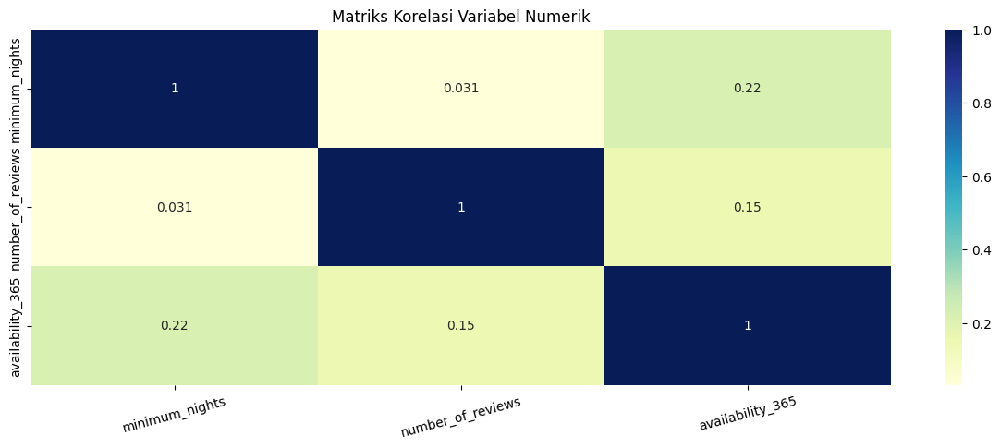

In [201]:
# Memilih hanya kolom-kolom numerik untuk analisis korelasi
numerical_columns = ['minimum_nights', 'number_of_reviews', 'availability_365']

# Membuat matriks korelasi untuk variabel numerik
correlation_matrix = df_top5[numerical_columns].corr(method='spearman')

plt.figure(figsize=(15, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='YlGnBu')
plt.title('Matriks Korelasi Variabel Numerik')
plt.xticks(rotation=15)
plt.show()

Berdasarkan matiks korelasi heatmap di atas, kita bisa melihat bahwa tidak ada variabel yang berkorelasi kuat terhadap terhadap availability_365. Artinya jumlah review dan minimum malam yang bisa disewa, tidak terlalu berhubungan terhadap properti tersebut untuk laku/tidak. Namun, jumlah minimum malam dan jumlah reviews pada properti yang paling laku, bisa dijadikan referensi oleh stakeholder untuk mengambil keputusan. 

Maka kita akan menjawab pertanyaan :
1. Berapa jumlah minimum malam pada properti yang paling laku?
2. Berapa jumlah review pada properti yang paling laku?

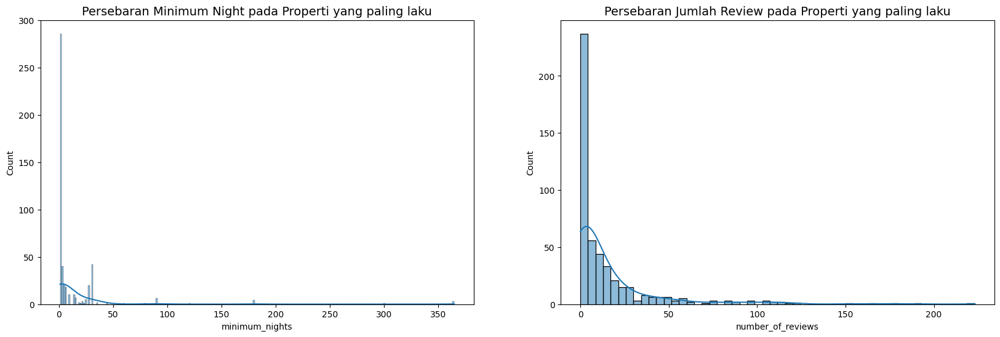

In [208]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
sns.histplot(data=df_top5, x='minimum_nights', kde=True)
plt.title('Persebaran Minimum Night pada Properti yang paling laku', size=14)

plt.subplot(1,2,2)
sns.histplot(data=df_top5, x='number_of_reviews', kde=True)
plt.title('Persebaran Jumlah Review pada Properti yang paling laku', size=14)

plt.show()

In [203]:
display(df_top5['minimum_nights'].median(), df_top5['number_of_reviews'].median())

2.0

5.0

Berdasarkan grafik di atas, kita dapat melihat bahwa persebaran jumlah minimum night yang paling laku cenderung berada di kiri(right skew) yang berarti banyak pemilik properti yang memilih minimum nightnya tidak terlalu lama. Kemudian juga jumlah properti yang paling laku juga cenderung berada di kiri(right skew) yang berarti tidak terlalu banyak yang mereview properti tersebut.

Maka kita akan menjawab pertanyaan :
1. Berapa jumlah minimum malam pada properti yang paling laku?
    - jumlah minimum malam pada properti paling laku adalah 2. Sehingga perusahaan dapat mempertimbangkan jumlah minimum malam yang baik adalah tidak terlalu lama untuk properti mereka.
2. Berapa jumlah review pada properti yang paling laku?
    - jumlah dari jumlah review pada properti paling laku adalah 5. Perusahaan tidak perlu khawatir jika propertinya tidak ada/ sedikit yang memberi ulasan. Dikarenakan banyak properti yang laku namun jumlah ulasannya sedikit. 

# **Kesimpulan dan Rekomendasi**

## **Kesimpulan**


Dari analisis yang telah dilakukan, kita dapat membuat kesimpulan terkait bagaimana karakteristik properti yang laku di airbnb Bangkok sebagai berikut :
1. Dari seluruh data list airbnb, hanya **7%** properti yang masuk ke dalam kategori laku (minimal tersewa 90% dalam 1 tahun)
2. Harga berdasarkan Tipe kamar yang paling tepat secara keseluruhan:
    - Hotel room: dengan kisaran harga 1700 bath. 
    - Entire home/apt: dengan kisaran 1536 bath.
    - Shared room : dengan kisaran harga 500 bath. 
    - Private room: dengan kisaran 1212 bath.
3. Properti yang paling laku, persebarannya berada di harga properti yang murah pada setiap tipenya.
4. Daerah dengan jumlah properti yang paling banyak banyak laku adalah Huai Khwang, posisi kedua : Vadhana, posisi ketiga : Khlong Toei
5. Properti yang laku tersebut, tersebar di daerah pusat/ tengah kota. Kemudian semakin ke pinggir kanan(timur) dan kiri(barat), semakin sedikit jumlah properti yang laku. Pada daerah pinggir juga ada daerah yang sama sekali tidak memenuhi kriteria laku/ tidak ada properti yang laku pada daerah tersebut.
6. Pada 10 daerah yang paling laku, terlihat bahwa shared room memiliki kisaran harga yang ter-rendah. Hotel room memiliki memiliki kisaran harga yang paling tinggi.
7. Tipe kamar yang paling banyak laku adalah Entire home/apt, dan posisi kedua adalah Private room, dan posisi ketiga adalah Hotel Room, dan posisi terakhir adalah Shared room
8. Setiap daerah memiliki karakteristik tipe kamar dan harga yang berbeda-beda. Sehingga perlakuan dalam pengambilan keputusan harus didasarkan oleh karakteristik daerah itu sendiri.
9. Terdapat 5 daerah dengan harga terbaik dan banyak properti yang laku ( masuk ke dalam 10 daerah terlaku) yaitu : Huai Khwang, Vadhana, Ratchathewi, Parthum Wan, dan Bang Na.
10. Kamar yang laku dan harga yang baik, memiliki jumlah ninimum night yang tidak terlalu lama. Persebarannya ada di 2 hari.
11. Banyaknya jumlah review / tidak, tidak mempengaruhi properti tersebut menjadi laku

## **Rekomendasi**

Setelah kita temukan karakteristik properti yang laku di airbnb bangkok, sekarang kami akan memberikan rekomendasi ke perusahaan berdasarkan data ini :
1. **Penetapan Harga yang Kompetitif** : Atur harga agar bisa bersaing dengan properti sejenis di daerah yang sama. Ini bisa mempengaruhi minat penyewa untuk memilih properti. Sesuaikan harga dengan tipe kamar dan karakteristik daerah, untuk itu kami sudah mensortir harga yang terbaik dari beberapa daerah yang paling laku. Lima kota yang kami sarankan untuk bisnis yang baik berada di kota :
	1. Huai Khwang
		- Dengan tipe kamar :
		- Entire home/apt dengan harga 1.057 bath
		- Private Room dengan harga 1.200 bath
		- Hotel Room dengan harga 5.011 bath
	2. Vadhana
		- Dengan tipe kamar :
		- Entire home/apt dengan harga 2.000 bath
		- Private room dengan harga 1.500 bath
		- Hotel room dengan harga 5.350 bath
	3. Ratchatdewi
		- Dengan tiper kamar :
		- Entire home/apt dengan harga 2.100 bath
		- Private room dengan harga 1.120 bath
		- Hotel room dengan harga 4.829 bath
	4. Parthum Wan
		- Dengan tipe kamar :
		- Entire home/apt dengan harga 2.279 bath
		- Private room dengan harga 6.142 bath
		- Hotel room dengan harga 6.612 bath
	5. Bang Na
		- Dengan tipe kamar :
		- Entire home/apt dengan harga 1.090 bath
		- Private room dengan harga 10.000 bath
2. **Diversifikasi Portofolio** : Jika memungkinkan, pertimbangkan untuk memiliki properti di beberapa daerah yang berbeda. Ini dapat membantu mengurangi risiko jika suatu daerah mengalami fluktuasi. Pertimbangan diversifikasi dengan poin berikut :
	1. Jika perusahaan ingin properti laku lebih banyak dengan perputaran uang yang cepat, namun jumlah pemasukan di setiap peroperti yang disewa stabil. Bisnis dapat dilakukan di Huai Kwang dan Vadhana dengan tipe kamar Entire home/ apt.
	2. Jika perusahaan ingin mendapatkan pemasukan yang lumayan besar, dengan risiko properti yang laku hampir stabil. Bisnis dapat dilakukan di Huai Khwang, Vadhana, Ratchatewi dan Partum Wan dengan tipe kamar Hotel Room. 
	3. Jika perusahaan ingin mendapatkan pemasukan yang besar, dengan risiko properti yang laku lebih sedikit dibanding yang lain. Bisnis dapat dilakukan di Bang Na dan Parthum Wan dengan tipe kamar Private Room. Agar memiliki peluang yang tinggi, membangun bisnis ini dilakukan dilokasi yang berdekatan dengan lokasi properti yang sudah ada. Dikarenakan pada daerah ini properti cenderung tersebar di lokasi tertentu.
3. **Hindari Tipe Kamar Shared** : Tipe kamar Shared cenderung kurang diminati, bahkan jika harganya murah. Sebaiknya fokus pada tipe kamar lain.
4. **Minimum Malam**: Pertimbangkan untuk menetapkan jumlah minimum malam yang cukup fleksibel, seperti 2 malam. Hal ini dapat meningkatkan daya tarik properti Anda, terutama bagi mereka yang mencari akomodasi singkat.

## **Saran terhadap Data**

Setelah kami coba untuk analisis, ternyata terdapat beberapa hal perlu ada pada data ini agar analisa semakin optimal:
1. Terdapat kolom terkait jumlah review dan rata-rata review per bulannya, namun tidak terdapat hasil reviewnya seperti apa? Apakah ulasannya baik / buruk? Seharusnya dapat ditambahkan hasil ulasannya, biasanya berbentuk range dari 1 - 5. Maka dapat dilihat korelasinya, apakah hasil ulasan ini berpengaruh terhadap propertinya laku/ tidak.
2. Akan lebih baik, jika dimasukkan data properti tersebut memiliki berapa kamar? dan berapa persen kamar yang laku dalam setahun? agar kami dapat melihat lebih detail tingkat okupansi dari penginapan tersebut.